# Attempts at decreasing the visibility of perturbations

In [1]:
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.optim as optim
import torch.utils.data as data_utils
import math
import torchvision.models as models
from PIL import Image
from deepfool.deepfool import deepfool, local_deepfool, deepfool_specific
import os
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import copy


from utils import diff, plot_diff, plot_comparaison, make_examples

In [2]:
import random

NUM_CLASSES = 10
MAX_ITER = 10
OVERSHOOT = 0.02
TARGET_CLASS = 0

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

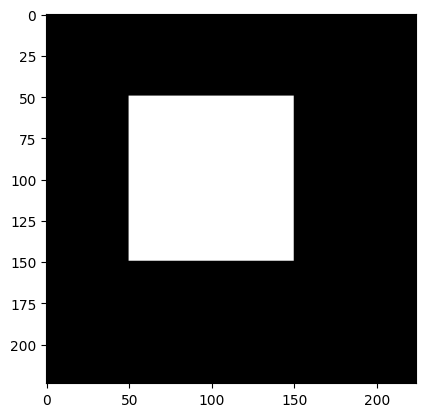

In [3]:
region_mask = np.zeros((224, 224), dtype=np.int32)
region_mask[50:150, 50:150] = 1


plt.imshow((region_mask))
plt.imshow(region_mask, cmap="gray")
plt.show()

region_mask = None

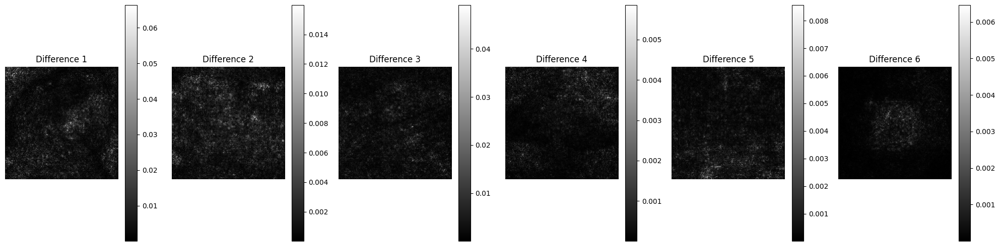

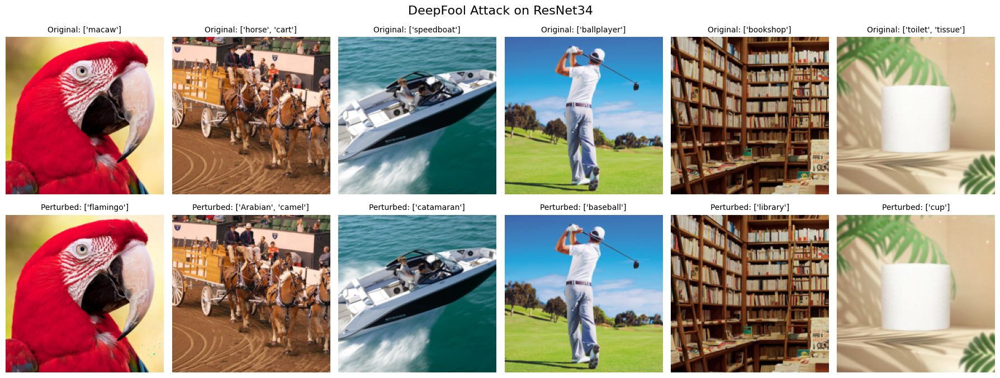

In [4]:
local_deepfool_args = {
    "num_classes": NUM_CLASSES,  # Number of classes
    "overshoot": OVERSHOOT,  # Maximum perturbation allowed
    "max_iter": MAX_ITER,  # Maximum number of iterations
    "region_mask": region_mask,  # Region mask for the image
}


(
    original_images,
    original_labels,
    original_images_norm,
    perturbed_images,
    perturbed_labels,
    perturbed_images_norm,
) = make_examples(local_deepfool, local_deepfool_args)

plot_diff(original_images_norm, perturbed_images_norm)

plot_comparaison(original_images, perturbed_images, original_labels, perturbed_labels)

\begin{equation}
	\hat{l}(x_0) = \arg \min_{k \neq \hat{k}} \frac{|f_{k}(x_0) - f_{\hat{k}}(x_0)|}{\gamma \|w_{k} - w_{\hat{k}}\|_2}
\end{equation}

This first equation represents the closest classification frontier to approach, with $k$ being the original class of $x_0$, and $\hat{k}$ another class. $f_k$ represents the classification function output for a given class $k$, and $w_k$ is the direction vector of said function for a given class. When we know what classification $\hat{k}$ is the closest, we can compute the minimal perturbation to get the image to pass the frontier and be classified as $\hat{k}$ :

\begin{equation}
	r_*(x_0) = \frac{|f_{\hat{l}(x_0)}(x_0) - f_k(x_0)|}{\|w_{\hat{l}(x_0)} - w_k\|_2^2} (w_{\hat{l}(x_0)} - w_k)
\end{equation}

In [5]:
def regular_inf_local_deepfool(
    image,
    net,
    num_classes=10,
    overshoot=0.02,
    max_iter=50,
    region_mask=None,
    decay_factor=0.9,
):
    is_cuda = torch.cuda.is_available()
    if is_cuda:
        image = image.cuda()
        net = net.cuda()

    input_shape = image.cpu().numpy().shape

    f_image = (
        net.forward(image.unsqueeze(0).requires_grad_(True))
        .detach()
        .cpu()
        .numpy()
        .flatten()
    )

    I = np.argsort(f_image)[::-1][:num_classes]
    label_orig = I[0]

    pert_image = copy.deepcopy(image)
    w = np.zeros(input_shape)
    r_tot = np.zeros(input_shape)

    iter = 0
    x = pert_image.unsqueeze(0).requires_grad_(True)
    pred_p = net.forward(x)
    label_pert = label_orig

    while label_pert == label_orig and iter < max_iter:
        pert = np.inf

        pred_p[0, label_orig].backward(retain_graph=True)
        grad_origin = x.grad.detach().cpu().numpy().copy()

        for k in range(1, num_classes):
            x.grad.zero_()

            pred_p[0, I[k]].backward(retain_graph=True)
            cur_grad = x.grad.detach().cpu().numpy().copy()

            w_k = np.zeros_like(cur_grad)

            if region_mask is None:
                w_k[0] = cur_grad[0] - grad_origin[0]
            else:
                w_k[0] = (cur_grad[0] - grad_origin[0]) * region_mask

            f_k = (pred_p[0, I[k]] - pred_p[0, label_orig]).item()  # Eq 8 in the paper
            # ! The norm of the perturbation is calculated differently from the paper
            pert_k = abs(f_k) / np.linalg.norm(
                decay_factor * w_k.flatten()
            ) # Eq 8 in the paper

            if pert_k < pert:
                pert = pert_k
                w = w_k

        r_i = pert * w / np.linalg.norm(w)  # Eq : 9
        if region_mask is None:
            r_tot += r_i[0]
        else:
            r_tot += r_i[0] * region_mask

        pert_image = image + torch.from_numpy(r_tot).to(image.device)

        x = pert_image.unsqueeze(0).requires_grad_(True)
        input = x.view(x.size()[-4:]).type(
            torch.cuda.FloatTensor if is_cuda else torch.FloatTensor
        )

        pred_p = net.forward(input)
        label_pert = np.argmax(pred_p.detach().cpu().numpy().flatten())
        iter += 1

    r_tot = (1 + overshoot) * r_tot
    return r_tot, iter, label_orig, label_pert, pert_image.unsqueeze(0)

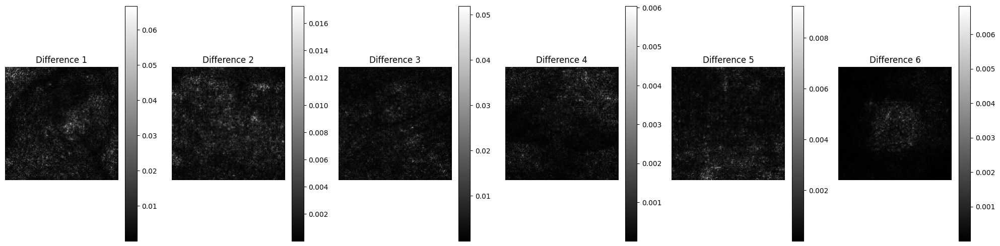

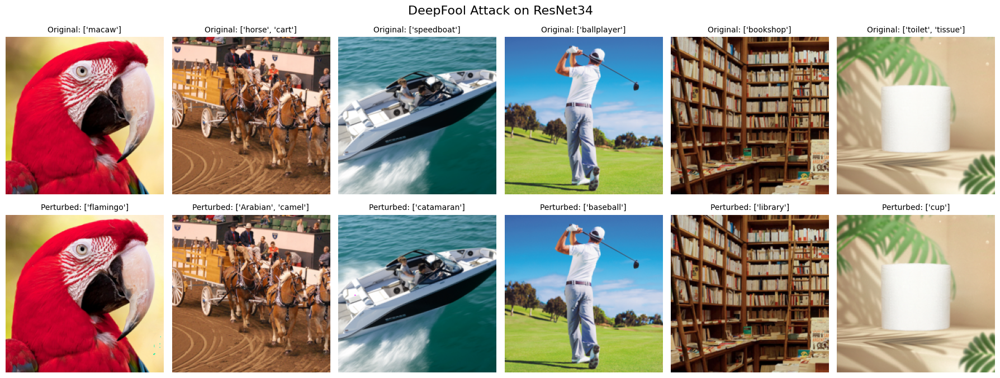

In [6]:
local_deepfool_args = {
    "num_classes": NUM_CLASSES,  # Number of classes
    "overshoot": OVERSHOOT,  # Maximum perturbation allowed
    "max_iter": MAX_ITER,  # Maximum number of iterations
    "region_mask": region_mask,  # Region mask for the image
    "decay_factor": 0.9,  # Decay factor
}


(
    inf_original_images,
    inf_original_labels,
    inf_original_images_norm,
    inf_perturbed_images,
    inf_perturbed_labels,
    inf_perturbed_images_norm,
) = make_examples(regular_inf_local_deepfool, local_deepfool_args)  # noqa: F821

plot_diff(inf_original_images_norm, inf_perturbed_images_norm)

plot_comparaison(
    inf_original_images, inf_perturbed_images, inf_original_labels, inf_perturbed_labels
)

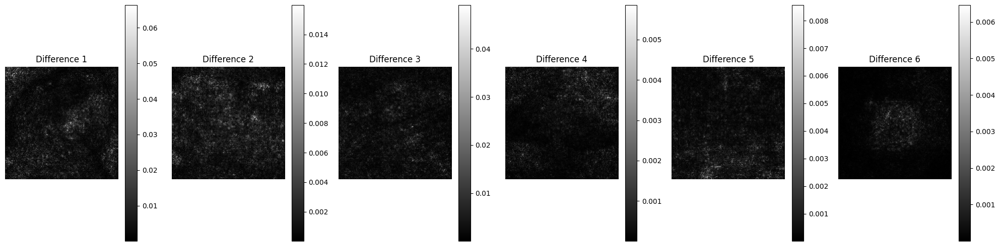

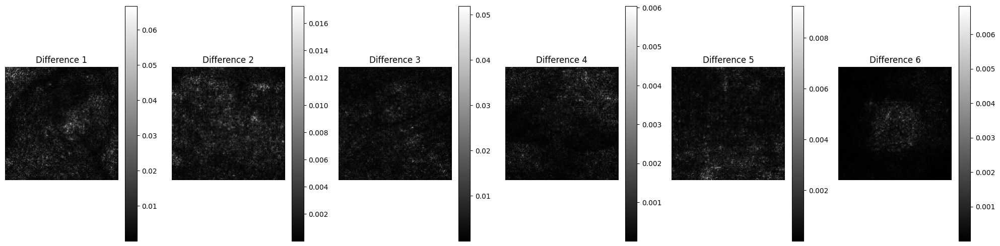

In [7]:
plot_diff(original_images_norm, perturbed_images_norm)
plot_diff(inf_original_images_norm, inf_perturbed_images_norm)

In [8]:

def min_inf_local_deepfool(
    image,
    net,
    num_classes=10,
    overshoot=0.02,
    max_iter=50,
    region_mask=None,
    decay_factor=0.9,
):
    is_cuda = torch.cuda.is_available()
    if is_cuda:
        image = image.cuda()
        net = net.cuda()

    input_shape = image.cpu().numpy().shape

    f_image = (
        net.forward(image.unsqueeze(0).requires_grad_(True))
        .detach()
        .cpu()
        .numpy()
        .flatten()
    )

    I = np.argsort(f_image)[::-1][:num_classes]
    label_orig = I[0]

    pert_image = copy.deepcopy(image)
    w = np.zeros(input_shape)
    r_tot = np.zeros(input_shape)
    r_i = np.ones(input_shape)

    iter = 0
    x = pert_image.unsqueeze(0).requires_grad_(True)
    pred_p = net.forward(x)
    label_pert = label_orig

    while label_pert == label_orig and iter < max_iter:
        pert = np.inf

        pred_p[0, label_orig].backward(retain_graph=True)
        grad_origin = x.grad.detach().cpu().numpy().copy()

        for k in range(1, num_classes):
            x.grad.zero_()

            pred_p[0, I[k]].backward(retain_graph=True)
            cur_grad = x.grad.detach().cpu().numpy().copy()

            w_k = np.zeros_like(cur_grad)

            if region_mask is None:
                w_k[0] = cur_grad[0] - grad_origin[0]
            else:
                w_k[0] = (cur_grad[0] - grad_origin[0]) * region_mask

            f_k = (pred_p[0, I[k]] - pred_p[0, label_orig]).item()  # Eq 8 in the paper
            pert_k = abs(f_k) / np.linalg.norm(w_k.flatten())  # Eq 8 in the paper

            # ! Finding the smallest infinite norm of perturbation
            pert = pert_k
            w = w_k
            
            new_r_i = pert * w / np.linalg.norm(w)  # Eq : 9
            
            if region_mask is not None:
                new_r_i[0] = new_r_i[0] * region_mask
            
            # print(r_i.shape, new_r_i[0].shape,np.linalg.norm(new_r_i, axis=1).shape, np.linalg.norm(r_i, axis=0).shape)
            # print(np.linalg.norm(np.linalg.norm(new_r_i, axis=0).flatten(), np.inf), np.linalg.norm(np.linalg.norm(r_i, axis=0).flatten(), np.inf))
            # if np.linalg.norm(np.linalg.norm(new_r_i, axis=0).flatten(), np.inf) < np.linalg.norm(np.linalg.norm(r_i, axis=0).flatten(), np.inf):
            if np.linalg.norm(new_r_i) < np.linalg.norm(r_i):
                r_i = new_r_i
            # ! End of the modification

        r_tot += r_i[0]

        pert_image = image + torch.from_numpy(r_tot).to(image.device)

        x = pert_image.unsqueeze(0).requires_grad_(True)
        input = x.view(x.size()[-4:]).type(
            torch.cuda.FloatTensor if is_cuda else torch.FloatTensor
        )

        pred_p = net.forward(input)
        label_pert = np.argmax(pred_p.detach().cpu().numpy().flatten())
        iter += 1

    r_tot = (1 + overshoot) * r_tot
    return r_tot, iter, label_orig, label_pert, pert_image.unsqueeze(0)

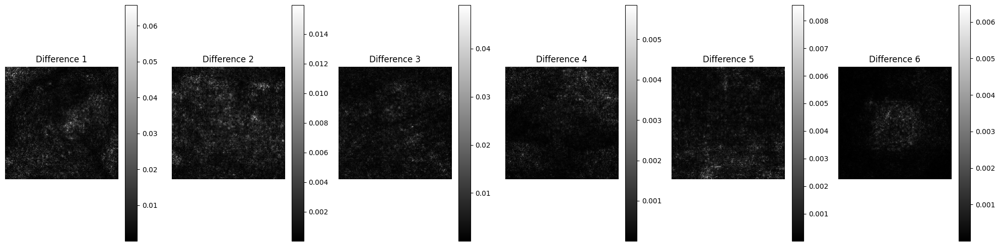

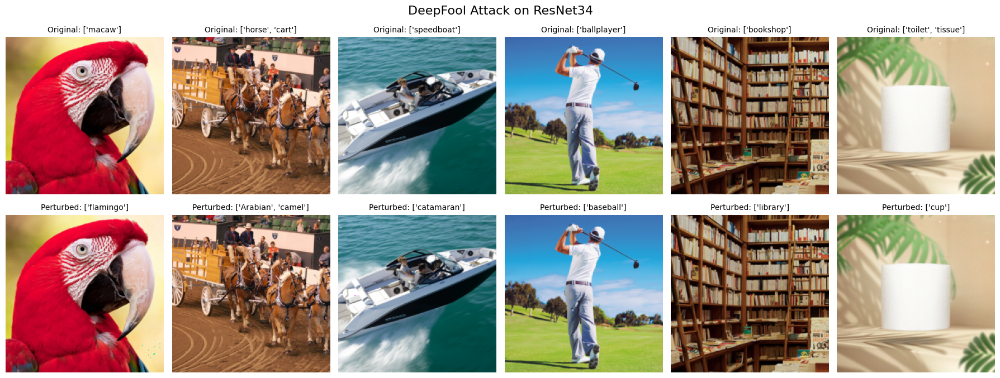

In [9]:
local_deepfool_args = {
    "num_classes": NUM_CLASSES,  # Number of classes
    "overshoot": OVERSHOOT,  # Maximum perturbation allowed
    "max_iter": MAX_ITER,  # Maximum number of iterations
    "region_mask": region_mask,  # Region mask for the image
    "decay_factor": 0.9,  # Decay factor
}


(
    min_original_images,
    min_original_labels,
    min_original_images_norm,
    min_perturbed_images,
    min_perturbed_labels,
    min_perturbed_images_norm,
) = make_examples(min_inf_local_deepfool, local_deepfool_args)  # noqa: F821

plot_diff(min_original_images_norm, min_perturbed_images_norm)

plot_comparaison(
    min_original_images, min_perturbed_images, min_original_labels, min_perturbed_labels
)

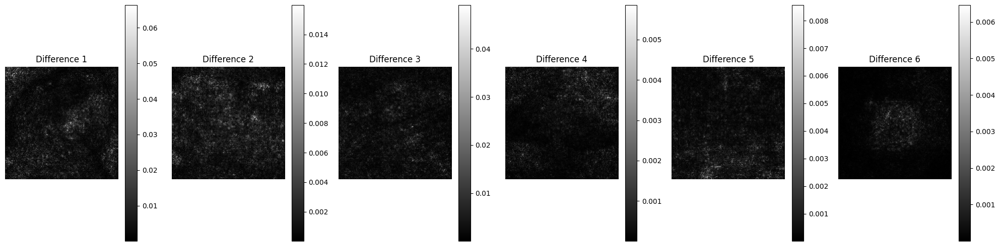

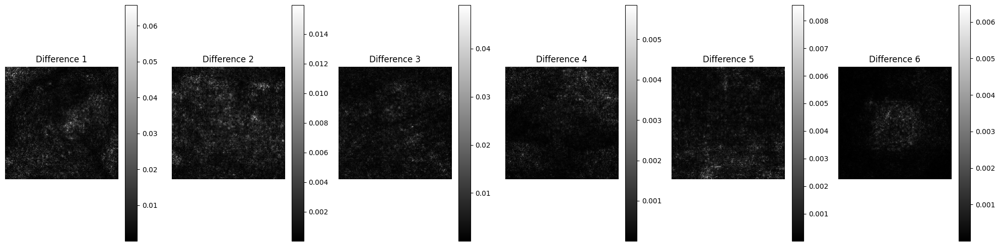

In [10]:
plot_diff(original_images_norm, perturbed_images_norm)
plot_diff(min_original_images_norm, min_perturbed_images_norm)

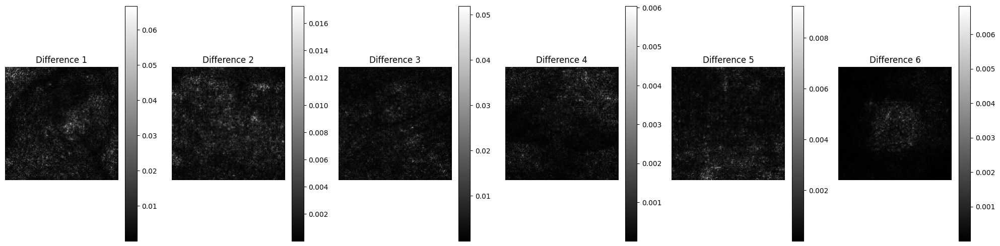

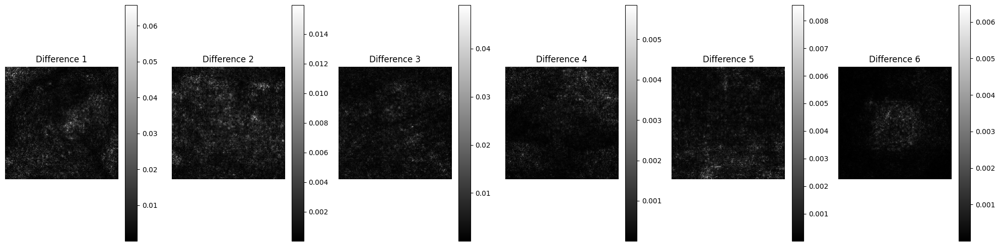

In [11]:
plot_diff(inf_original_images_norm, inf_perturbed_images_norm)
plot_diff(min_original_images_norm, min_perturbed_images_norm)

# Extensive evaluation

In [12]:
from torchvision import transforms, models, datasets
from torch.utils.data import Dataset, DataLoader, random_split
from utils import perturb_set, diff, plot_diff, plot_comparaison, make_examples
import os
import torch
from torch import nn
from deepfool.deepfool import deepfool, local_deepfool, deepfool_specific
import torchvision
import numpy as np
import torch.utils.data as data_utils

try:
    train_set = torchvision.datasets.Imagenette(
        root="./dataset", split="train", download=True
    )
    val_set = torchvision.datasets.Imagenette(
        root="./dataset", split="val", download=True
    )
except:
    print("Error while downloading the dataset")

Error while downloading the dataset


In [13]:
transform = transforms.Compose(
    [transforms.Resize(256), transforms.CenterCrop(224), transforms.ToTensor()]
)

orig_train_set = datasets.ImageFolder(
    "./dataset/imagenette2/train", transform=transform
)

orig_val_set = datasets.ImageFolder("./dataset/imagenette2/val", transform=transform)


transform_net = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ]
)

train_set = datasets.ImageFolder("./dataset/imagenette2/train", transform=transform_net)

val_set = datasets.ImageFolder("./dataset/imagenette2/val", transform=transform_net)
# Create a smaller validation set
sub_size = 500
sub_val_set, _ = random_split(val_set, [sub_size, len(val_set) - sub_size])

LABELS = {
    line.split(" ")[0]: " ".join(line.split(" ")[1:])
    for line in open(os.path.join("data/demo_deepfool/synset_words.txt"), "r")
    .read()
    .split("\n")
}


def id2label(id):
    return LABELS[id].split(",")


# Explore the train_set
print(f"Number of training samples: {len(train_set)}")
print(f"Classes in training set: {train_set.classes}")

# Explore the val_set
print(f"Number of validation samples: {len(val_set)}")
print(f"Classes in validation set: {val_set.classes}")

Number of training samples: 9469
Classes in training set: ['n01440764', 'n02102040', 'n02979186', 'n03000684', 'n03028079', 'n03394916', 'n03417042', 'n03425413', 'n03445777', 'n03888257']
Number of validation samples: 3925
Classes in validation set: ['n01440764', 'n02102040', 'n02979186', 'n03000684', 'n03028079', 'n03394916', 'n03417042', 'n03425413', 'n03445777', 'n03888257']


In [14]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.resnet = torchvision.models.resnet34(pretrained=True)
        self.resnet.fc = torch.nn.Linear(self.resnet.fc.in_features, 10)

    def forward(self, x):
        output = self.resnet(x)
        return output


def load_model_parameters(model, path):
    if os.path.isfile(path):
        model.load_state_dict(torch.load(path))
        print("Model parameters loaded successfully.")
    else:
        print("Model parameter file not found.")


# Example usage
model = Net()
load_model_parameters(model, "resnet34_imagenette.pth")


mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]


def clip_tensor(A, minv, maxv):
    return torch.clamp(A, minv, maxv)


clip = lambda x: clip_tensor(x, 0, 255)

tf = transforms.Compose(
    [
        transforms.Normalize(
            mean=[0, 0, 0], std=[1 / s for s in std]
        ),
        transforms.Normalize(mean=[-m for m in mean], std=[1, 1, 1]),
        transforms.Lambda(clip),
        transforms.ToPILImage(),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ]
)

/home/mkherraz001/miniconda3/envs/torch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/mkherraz001/miniconda3/envs/torch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model parameters loaded successfully.


/tmp/ipykernel_699541/1173208238.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path))


In [15]:
NUM_CLASSES = 10
MAX_ITER = 50
OVERSHOOT = 0.02
TARGET_CLASS = 0

deepfool_args = {
    "num_classes": NUM_CLASSES,  # Number of classes
    "overshoot": OVERSHOOT,  # Maximum perturbation allowed
    "max_iter": MAX_ITER,  # Maximum number of iterations
}

deepfool_perturbed_val_set = perturb_set(deepfool, sub_val_set, model, deepfool_args)
regular_perb_val_set = perturb_set(regular_inf_local_deepfool, sub_val_set, model, local_deepfool_args)
min_inf_perb_val_set = perturb_set(min_inf_local_deepfool, sub_val_set, model, local_deepfool_args)

Perturbing images: 100%|██████████| 500/500 [05:30<00:00,  1.51it/s]


torch.Size([3, 224, 224])
torch.Size([224, 224])


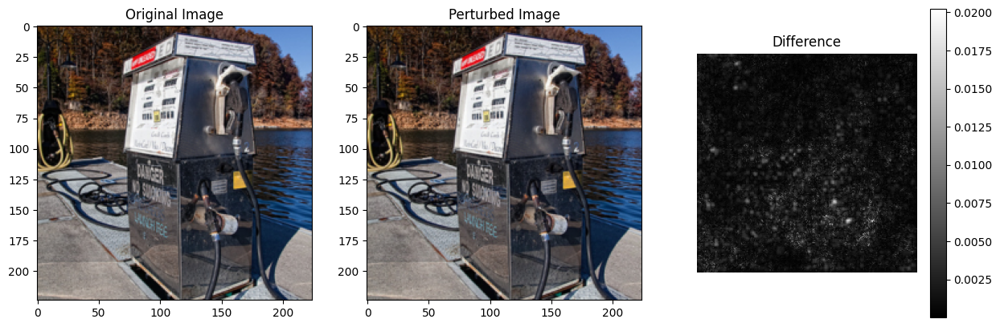

torch.Size([3, 224, 224])
torch.Size([224, 224])


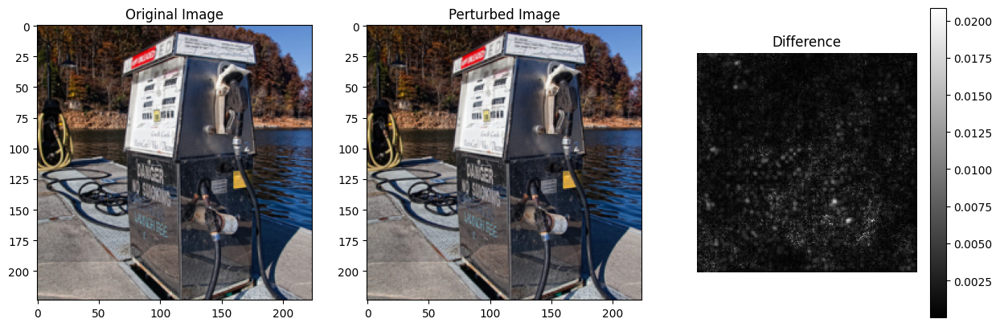

torch.Size([3, 224, 224])
torch.Size([224, 224])


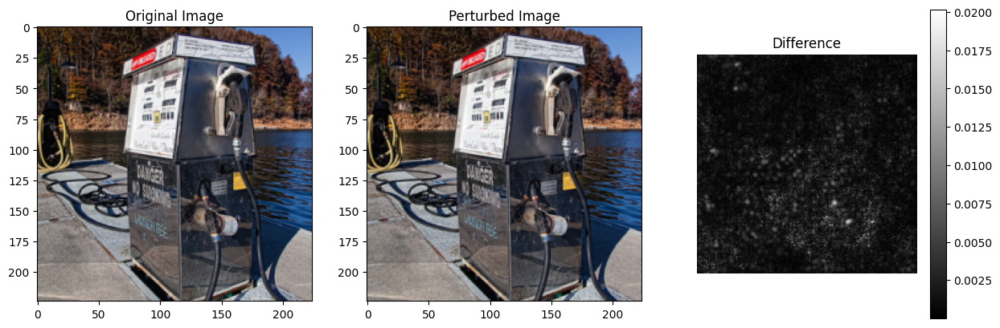

Norm 2 of pertubation: range , and mean
deepfool : [0.0105, 1.2684], Mean: 0.3000. 
Pert values : [0.0000, 0.0707], Mean: 0.0010
regular : [0.0113, 1.3127], Mean: 0.3113. 
Pert values : [0.0000, 0.0741], Mean: 0.0010
min_inf : [0.0105, 1.2740], Mean: 0.3000. 
Pert values : [0.0000, 0.0706], Mean: 0.0010


In [16]:

def pertubation_norm_diffs(dataset, perturbed_dataset):
    norms2 = []
    mean_pert = []
    for i in range(len(dataset)):
        orig_img = dataset[i][0].cpu()
        pert_img = perturbed_dataset[i][0][0].cpu()
        diff_ = diff(orig_img, pert_img).detach()
        norms2.append(np.linalg.norm(diff_[0]))
        diff_gray = torch.mean(diff_, dim=0)
        mean_pert.append(diff_gray)
        
        if i == 0:
            # Display the images
            orig_img_pil = transforms.ToPILImage()(tf(orig_img))
            pert_img_pil = transforms.ToPILImage()(tf(pert_img))

            fig, axs = plt.subplots(1, 3, figsize=(15, 5))
            axs[0].imshow(orig_img_pil)
            axs[0].set_title("Original Image")
            axs[1].imshow(pert_img_pil)
            axs[1].set_title("Perturbed Image")
            print(diff_.shape)
            print(diff_gray.shape)
            im = axs[2].imshow(diff_gray, cmap="gray")
            axs[2].set_title("Difference")
            axs[2].axis("off")
            fig.colorbar(im, ax=axs[2], orientation="vertical")
        plt.show()
    
    return norms2, mean_pert

deepfool_diffs_n2, mean_pert = pertubation_norm_diffs(sub_val_set, deepfool_perturbed_val_set)
regular_perb_diffs_n2, reg_mean_pert = pertubation_norm_diffs(sub_val_set, regular_perb_val_set)
min_inf_diffs_n2, min_inf_mean_pert = pertubation_norm_diffs(sub_val_set, min_inf_perb_val_set)

print(f"Norm 2 of pertubation: range , and mean")
print(f"deepfool : [{np.min(deepfool_diffs_n2):.4f}, {np.max(deepfool_diffs_n2):.4f}], Mean: {np.mean(deepfool_diffs_n2):.4f}. \nPert values : [{np.min(mean_pert):.4f}, {np.max(mean_pert):.4f}], Mean: {np.mean(mean_pert):.4f}")
print(f"regular : [{np.min(regular_perb_diffs_n2):.4f}, {np.max(regular_perb_diffs_n2):.4f}], Mean: {np.mean(regular_perb_diffs_n2):.4f}. \nPert values : [{np.min(reg_mean_pert):.4f}, {np.max(reg_mean_pert):.4f}], Mean: {np.mean(reg_mean_pert):.4f}")
print(f"min_inf : [{np.min(min_inf_diffs_n2):.4f}, {np.max(min_inf_diffs_n2):.4f}], Mean: {np.mean(min_inf_diffs_n2):.4f}. \nPert values : [{np.min(min_inf_mean_pert):.4f}, {np.max(min_inf_mean_pert):.4f}], Mean: {np.mean(min_inf_mean_pert):.4f}")